<a href="https://www.kaggle.com/code/annamalkova88/ovarian-cancer-myvers?scriptVersionId=150810142" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<div class="list-group" id="list-tab" role="tablist">
<h2 class="list-group-item list-group-item-action active" data-toggle="list" style='background:violet; border:0; color:white' role="tab" aria-controls="home"><center>Quick navigation</center></h2>

* [0. Installation of libraries](#0)
* [1. Basic Data Overview](#1)
* [2. Transformation of data](#2)
* [3. Convolutional networks](#3)

<a id="0"></a>
<h2 style='background:violet; border:0; color:white'><center>0. Installation of libraries</center><h2>

In [91]:
# BigQuery
from google.cloud import bigquery
bigquery_client = bigquery.Client(project='global-baton-404607')

Please ensure you have selected a BigQuery account in the Notebook Add-ons menu.


In [92]:
import numpy as np
import os
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import imageio
import plotly.express as px
from skimage import io 
from PIL import Image

import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.models as M
import tensorflow.keras.layers as L
import tensorflow.keras.backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

<a id="1"></a>
<h2 style='background:violet; border:0; color:white'><center>1. Basic Data Overview</center><h2>

In [93]:
train_df = pd.read_csv('/kaggle/input/UBC-OCEAN/train.csv')
display(train_df.head(),
        train_df.info(), 
        'Missing values',
        train_df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 538 entries, 0 to 537
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image_id      538 non-null    int64 
 1   label         538 non-null    object
 2   image_width   538 non-null    int64 
 3   image_height  538 non-null    int64 
 4   is_tma        538 non-null    bool  
dtypes: bool(1), int64(3), object(1)
memory usage: 17.5+ KB


,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False


None

'Missing values'

image_id        0
label           0
image_width     0
image_height    0
is_tma          0
dtype: int64

In [94]:
fig=px.histogram(train_df.groupby(['label','is_tma'],as_index=False)['is_tma'].value_counts(),
                 x='label', 
                 y='count',
                 color='is_tma',
                 text_auto=True,
                 title='Distribution of histological types'
                )
fig.show()

Because of the limit of memory the work will be proceeded with thumbnail files

In [95]:
train_df['filename'] = train_df['image_id'].astype(str)+'_thumbnail.png'
file_paths = {}
for root, _, files in os.walk('/kaggle/input/UBC-OCEAN/train_thumbnails'):
    for filename in files:
        path = os.path.join(root, filename)  
        file_paths[filename]=path
        
train_df['path'] = train_df['filename'].map(file_paths)
train_df.head()

,image_id,label,image_width,image_height,is_tma,filename,path
0,4,HGSC,23785,20008,False,4_thumbnail.png,/kaggle/input/UBC-OCEAN/train_thumbnails/4_thu...
1,66,LGSC,48871,48195,False,66_thumbnail.png,/kaggle/input/UBC-OCEAN/train_thumbnails/66_th...
2,91,HGSC,3388,3388,True,91_thumbnail.png,NaN
3,281,LGSC,42309,15545,False,281_thumbnail.png,/kaggle/input/UBC-OCEAN/train_thumbnails/281_t...
4,286,EC,37204,30020,False,286_thumbnail.png,/kaggle/input/UBC-OCEAN/train_thumbnails/286_t...


In [96]:
train_df.dropna(axis=0, inplace=True)

In [97]:
fig=px.histogram(train_df.groupby(['label','is_tma'],as_index=False)['is_tma'].value_counts(),
                 x='label', 
                 y='count',
                 color='is_tma',
                 text_auto=True,
                 title='Distribution of histological types'
                )
fig.show()

We see that the data is imbalanced, which can be an issue for further modelling

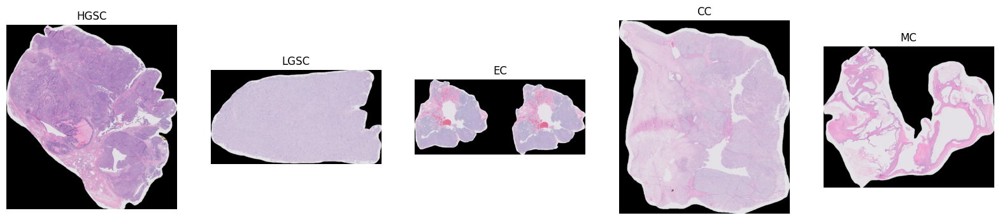

In [98]:
import matplotlib.image as mpimg

labels = train_df['label'].unique()
image_paths = []

for label in labels:
    path = train_df[train_df['label'] == label].sample(n=1, random_state=42)['path'].values[0]
    image_paths.append(path)
fig, axes = plt.subplots(1, len(image_paths), figsize=(20, 5))

for i, path in enumerate(image_paths):
    img = mpimg.imread(path)
    axes[i].imshow(img)
    axes[i].set_title(labels[i])
    axes[i].axis('off')

plt.show()


We see that the format of pictures and of slices are variable, which can be also a cause of bad predictions.

# First experiments (werent included)
The first modelling with basic augmentation, artificial networks with different parameters (activation (sigmoid/relu) and optimizing (adam/sgd) functions) showed very low accuracy - just 43% were detected correctly:
accuracy: 0.4208
val_accuracy: 0.4297
The data or the model should be improved

<a id="2"></a>
<h2 style='background:violet; border:0; color:white'><center>2. Transformation of data</center><h2>

# 0.Decrease the images size

In [99]:
output_folder = '/kaggle/working/train_small/'
os.makedirs(output_folder, exist_ok=True)
train_df.reset_index(inplace=True)
for i in range(train_df.shape[0]):
    input_path = train_df.loc[i, 'path']
    image = Image.open(input_path)
    width, height = image.size
    new_width = 1000  # specify the new width
    new_height = int(height * (new_width / width))  # calculate the new height to maintain the aspect ratio
    resized_img = image.resize((new_width, new_height))
    output_path = os.path.join(output_folder, train_df.loc[i, 'filename'])
    resized_img.save(output_path)

In [100]:
train_small=train_df.copy()
file_paths = {}
for root, _, files in os.walk('/kaggle/working/train_small/'):
    for filename in files:
        path = os.path.join(root, filename)  
        file_paths[filename]=path
        
train_small['path'] = train_small['filename'].map(file_paths)
train_small.head()

,index,image_id,label,image_width,image_height,is_tma,filename,path
0,0,4,HGSC,23785,20008,False,4_thumbnail.png,/kaggle/working/train_small/4_thumbnail.png
1,1,66,LGSC,48871,48195,False,66_thumbnail.png,/kaggle/working/train_small/66_thumbnail.png
2,3,281,LGSC,42309,15545,False,281_thumbnail.png,/kaggle/working/train_small/281_thumbnail.png
3,4,286,EC,37204,30020,False,286_thumbnail.png,/kaggle/working/train_small/286_thumbnail.png
4,5,431,HGSC,39991,40943,False,431_thumbnail.png,/kaggle/working/train_small/431_thumbnail.png


# 1. Creation of data set with known doubled pictures

In [101]:
def plot40(image_paths,image_ids):
    num_rows = 5
    num_cols = 8
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))
    for i, ax in enumerate(axes.flat):
        if i < len(image_paths):
            img_path = image_paths[i]
            img_id = image_ids[i]
            img = mpimg.imread(img_path)
            ax.imshow(img)
            ax.set_title(f"Image ID: {img_id}")
            ax.axis('off')
        else:
            ax.axis('off')
    plt.tight_layout()
    plt.show()

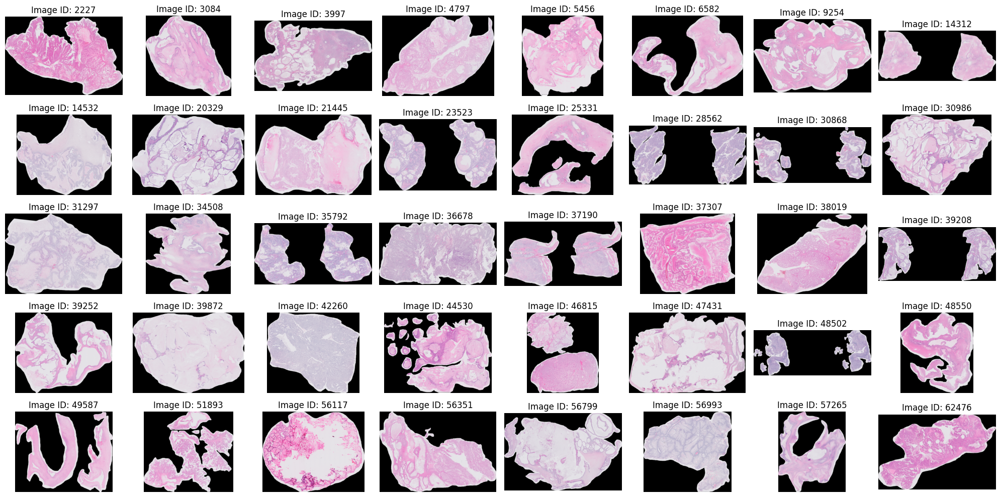

In [102]:
mc_df = train_small[train_small['label'] == 'MC']
image_paths = mc_df['path'].unique()
image_ids = mc_df['image_id'].unique()
plot40(image_paths,image_ids)

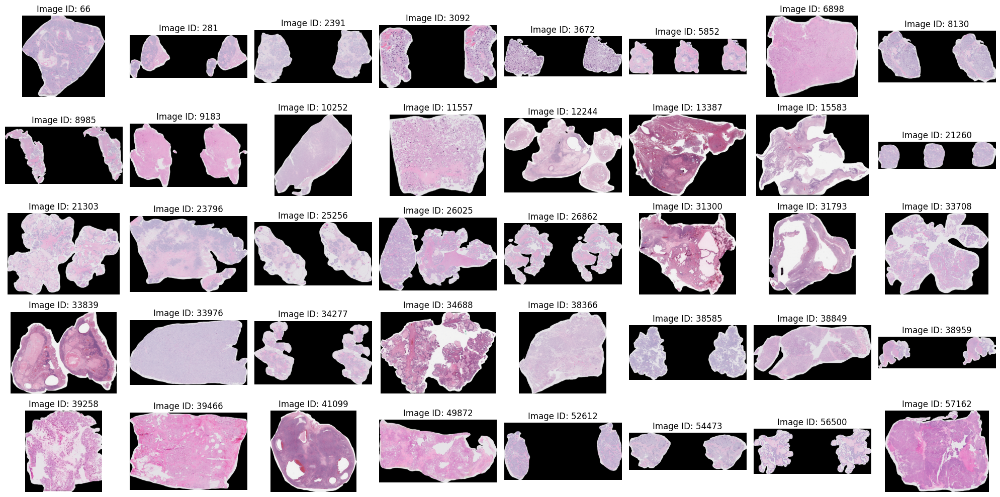

In [103]:
lgsc_df = train_small[train_small['label'] == 'LGSC']
image_paths = lgsc_df['path'].unique()
image_ids = lgsc_df['image_id'].unique()
plot40(image_paths,image_ids)

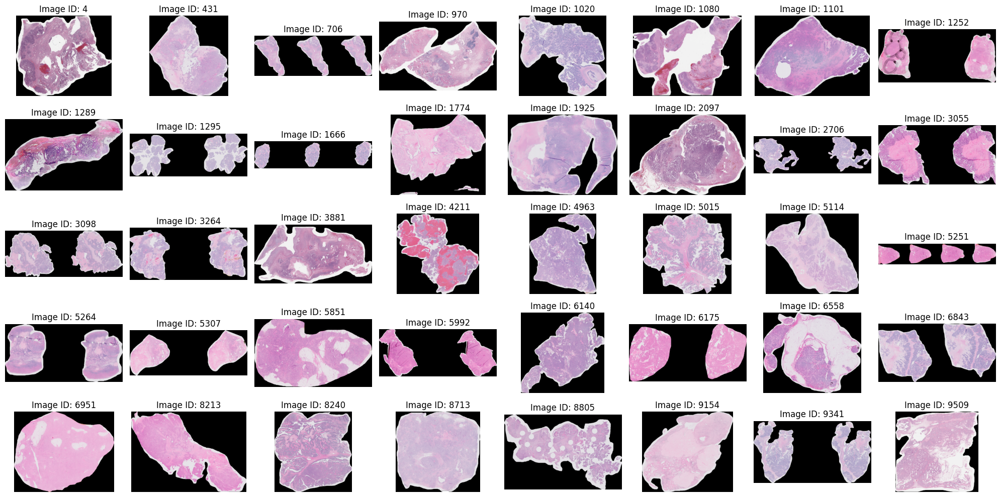

In [104]:
hgsc_df = train_small[train_small['label'] == 'HGSC']
image_paths = hgsc_df['path'].unique()
image_ids = hgsc_df['image_id'].unique()
plot40(image_paths,image_ids)

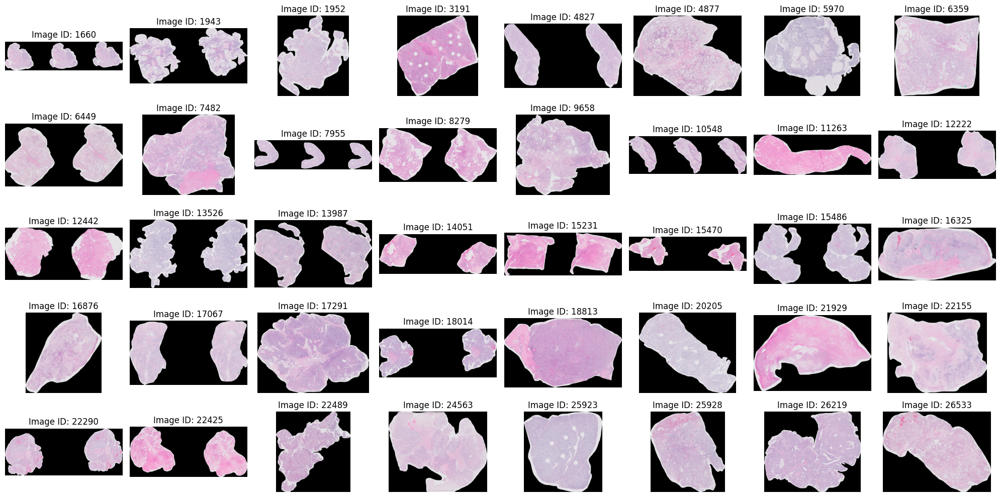

In [105]:
cc_df = train_small[train_small['label'] == 'CC']
image_paths = cc_df['path'].unique()
image_ids = cc_df['image_id'].unique()
plot40(image_paths,image_ids)

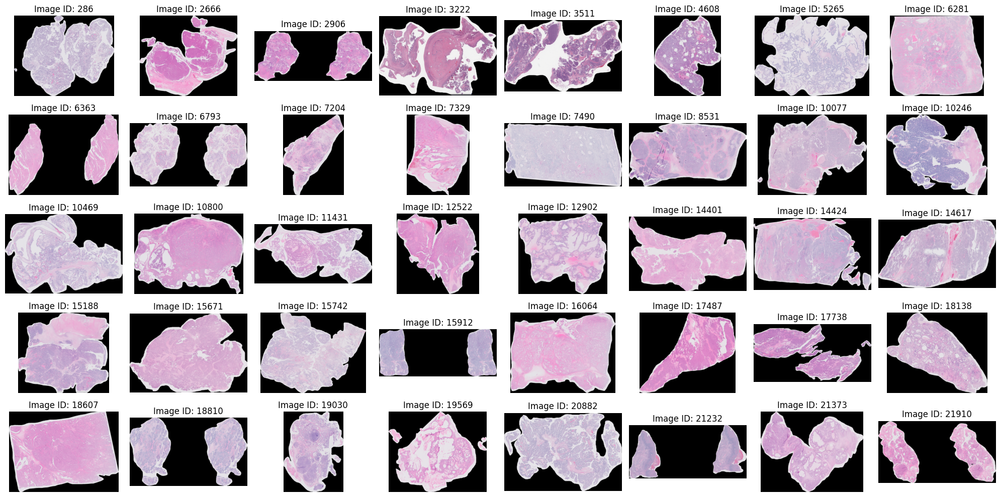

In [106]:
ec_df = train_small[train_small['label'] == 'EC']
image_paths = ec_df['path'].unique()
image_ids = ec_df['image_id'].unique()
plot40(image_paths,image_ids)

In [107]:
#The images with double slices:
doubled=[14312,23523,28562,30868,35792,37190,
         39208,48502,281,2391,3092,3672,8130,
         8985,9183,25256,26862,34277,38585,
         38959,52612,54473,56500,
         1252,1295,2706,3055,5264,5307,5992,6175,6843,9341,
         1943,4827,8279,12222,12442,13526,13987,14051,15231,15470,15486,17067,18014,22290,
         2906,6793,15912,18810,21232,21910,22425,6363, 6449, 3098
        ]
four_pics = [5251,61689]
three_pics = [5852,21260,706,1666,1660,7955,10548]

In [108]:
df = pd.concat([mc_df.iloc[:40],lgsc_df.iloc[:40]])
df = pd.concat([df,hgsc_df.iloc[:40]])
df = pd.concat([df,cc_df.iloc[:40]])
df = pd.concat([df,ec_df.iloc[:40]])

df['doubled'] = df['image_id'].apply(lambda x: '2' if x in doubled 
                                     else '3' if x in three_pics
                                     else '4' if x in four_pics
                                     else '1')

display(df.head(),
        df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 20 to 176
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   index         200 non-null    int64 
 1   image_id      200 non-null    int64 
 2   label         200 non-null    object
 3   image_width   200 non-null    int64 
 4   image_height  200 non-null    int64 
 5   is_tma        200 non-null    bool  
 6   filename      200 non-null    object
 7   path          200 non-null    object
 8   doubled       200 non-null    object
dtypes: bool(1), int64(4), object(4)
memory usage: 14.3+ KB


,index,image_id,label,image_width,image_height,is_tma,filename,path,doubled
20,21,2227,MC,60063,40187,False,2227_thumbnail.png,/kaggle/working/train_small/2227_thumbnail.png,1
26,27,3084,MC,44749,42274,False,3084_thumbnail.png,/kaggle/working/train_small/3084_thumbnail.png,1
35,36,3997,MC,49467,29610,False,3997_thumbnail.png,/kaggle/working/train_small/3997_thumbnail.png,1
38,40,4797,MC,53623,38587,False,4797_thumbnail.png,/kaggle/working/train_small/4797_thumbnail.png,1
48,50,5456,MC,45663,45226,False,5456_thumbnail.png,/kaggle/working/train_small/5456_thumbnail.png,1


None

In [109]:
df.doubled.value_counts()

doubled
1    135
2     57
3      7
4      1
Name: count, dtype: int64

In [110]:
# dataset with unknown number of doubled slices
ind = df.index
predict_df = train_small[~train_small.index.isin(ind)]

predict_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 313 entries, 84 to 512
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   index         313 non-null    int64 
 1   image_id      313 non-null    int64 
 2   label         313 non-null    object
 3   image_width   313 non-null    int64 
 4   image_height  313 non-null    int64 
 5   is_tma        313 non-null    bool  
 6   filename      313 non-null    object
 7   path          313 non-null    object
dtypes: bool(1), int64(4), object(3)
memory usage: 19.9+ KB


# 2. Prediction of the doubled images

In [111]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rescale=1./255.,
    validation_split=0.25,
    rotation_range=40,
    horizontal_flip=True,
    fill_mode='nearest')

train_generator = datagen.flow_from_dataframe(
    dataframe=df,
    directory="/kaggle/working/train_small",
    x_col='path',
    y_col="doubled",
    subset="training",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(100,100))

validation_generator = datagen.flow_from_dataframe(
    dataframe=df,
    directory="/kaggle/working/train_small",
    x_col='path',
    y_col="doubled",
    subset="validation",
    batch_size=32,
    seed=42,
    shuffle=False,
    class_mode="categorical",
    target_size=(100,100))


Found 150 validated image filenames belonging to 4 classes.
Found 50 validated image filenames belonging to 4 classes.


In [112]:
model_doubled = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(4, activation='softmax')  # num_classes is the number of output classes
])
model_doubled.compile(optimizer='adam',
              loss='categorical_crossentropy',  
              metrics=['accuracy'])
model_doubled.fit(train_generator, epochs=5, validation_data=validation_generator)

Epoch 1/5
5/5 [==============================] - 6s 1s/step - loss: 0.8033 - accuracy: 0.7000 - val_loss: 0.5071 - val_accuracy: 0.7800
Epoch 2/5
5/5 [==============================] - 4s 942ms/step - loss: 0.3451 - accuracy: 0.9333 - val_loss: 0.1654 - val_accuracy: 0.9400
Epoch 3/5
5/5 [==============================] - 4s 957ms/step - loss: 0.2169 - accuracy: 0.9400 - val_loss: 0.1639 - val_accuracy: 0.9400
Epoch 4/5
5/5 [==============================] - 4s 943ms/step - loss: 0.1273 - accuracy: 0.9800 - val_loss: 0.1209 - val_accuracy: 0.9400
Epoch 5/5
5/5 [==============================] - 4s 925ms/step - loss: 0.1149 - accuracy: 0.9800 - val_loss: 0.0689 - val_accuracy: 0.9800


In [113]:
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=predict_df,               
    directory="/kaggle/working/train_small",  
    batch_size=32,                      
    seed=42,                            
    shuffle=False,                      # Set shuffle to False for test data
    target_size=(100, 100),             
    class_mode=None,                    # Set class_mode to None because there are no labels for test data
    x_col='path'                        
)
predictions = model_doubled.predict(test_generator)
predicted_classes = []
classes = ['1', '2', '3', '4']

for prediction in predictions:
    predicted_class_index = np.argmax(prediction)
    predicted_class = classes[predicted_class_index]  
    predicted_classes.append(predicted_class)  
predict_df_copy = predict_df.copy()
predict_df_copy.loc[:, 'doubled'] = predicted_classes

Found 313 validated image filenames.
10/10 [==============================] - 6s 604ms/step


In [114]:
predict_df_copy.doubled.value_counts(normalize=True)

doubled
1    0.597444
2    0.354633
3    0.047923
Name: proportion, dtype: float64

In [115]:
train = pd.concat([predict_df_copy,df])
display(train.info(),
       train.head())

<class 'pandas.core.frame.DataFrame'>
Index: 513 entries, 84 to 176
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   index         513 non-null    int64 
 1   image_id      513 non-null    int64 
 2   label         513 non-null    object
 3   image_width   513 non-null    int64 
 4   image_height  513 non-null    int64 
 5   is_tma        513 non-null    bool  
 6   filename      513 non-null    object
 7   path          513 non-null    object
 8   doubled       513 non-null    object
dtypes: bool(1), int64(4), object(4)
memory usage: 36.6+ KB


None

,index,image_id,label,image_width,image_height,is_tma,filename,path,doubled
84,88,9697,HGSC,42323,19928,False,9697_thumbnail.png,/kaggle/working/train_small/9697_thumbnail.png,1
86,90,10143,HGSC,40063,42207,False,10143_thumbnail.png,/kaggle/working/train_small/10143_thumbnail.png,1
91,95,10642,HGSC,69213,41391,False,10642_thumbnail.png,/kaggle/working/train_small/10642_thumbnail.png,2
93,97,10896,HGSC,48060,37792,False,10896_thumbnail.png,/kaggle/working/train_small/10896_thumbnail.png,1
95,99,11417,HGSC,32591,32600,False,11417_thumbnail.png,/kaggle/working/train_small/11417_thumbnail.png,1


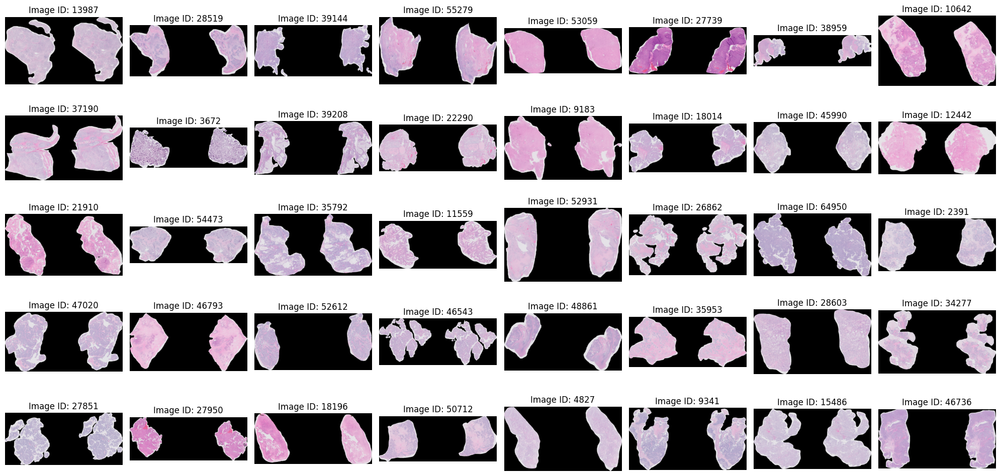

In [116]:
# check if we marked doubled slices correctly
doub_df = train[train['doubled'] == '2'].sample(n=40)
image_paths = doub_df['path'].unique()
image_ids = doub_df['image_id'].unique()
plot40(image_paths,image_ids)

In [117]:
def plot10(image_paths,image_ids):
    num_rows = 2
    num_cols = 5
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5))
    for i, ax in enumerate(axes.flat):
        if i < len(image_paths):
            img_path = image_paths[i]
            img_id = image_ids[i]
            img = mpimg.imread(img_path)
            ax.imshow(img)
            ax.set_title(f"Image ID: {img_id}")
            ax.axis('off')
        else:
            ax.axis('off')
    plt.tight_layout()
    plt.show()

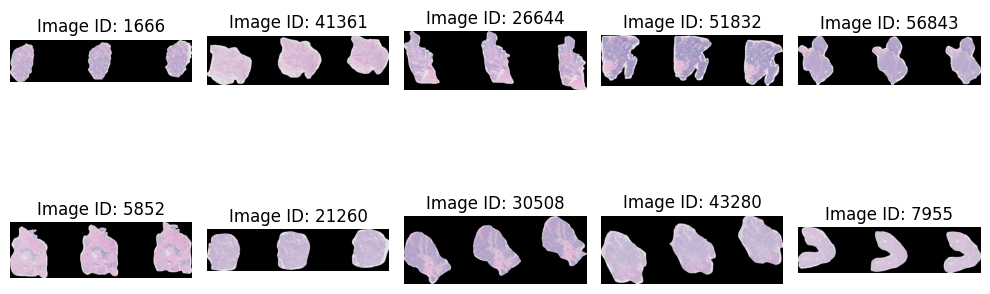

In [118]:
doub_df = train[train['doubled'] == '3'].sample(n=10)
image_paths = doub_df['path'].unique()
image_ids = doub_df['image_id'].unique()
plot10(image_paths,image_ids)

In [119]:
#in case the 4-pics werent distinguished
train.loc[train['image_id'] == 61689, 'doubled'] = '4'

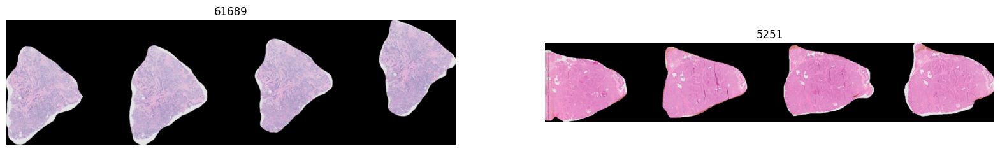

In [120]:
doub_list = train[train['doubled'] == '4']['image_id'].to_list()
image_paths = []
for pic in doub_list:
    path = train[train['image_id'] == pic]['path'].values[0]
    image_paths.append(path)

fig, axes = plt.subplots(1, len(doub_list), figsize=(20, 5))

for i, path in enumerate(image_paths):
    img = mpimg.imread(path)
    axes[i].imshow(img)
    axes[i].set_title(doub_list[i])
    axes[i].axis('off')

plt.show()

Pictures which were classified incorrectly:

as 3:61100 (6), 35909(1)

as 2:30515(3)

as 1:3264(2)

as 4: 52308(?)

In [121]:
# Problematic pictures:
pics=[61100, 35909, 30515, 3264, 52308, 49587]
mask = train['image_id'].isin(pics)
train_filt = train.loc[~mask]
train_filt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 507 entries, 84 to 176
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   index         507 non-null    int64 
 1   image_id      507 non-null    int64 
 2   label         507 non-null    object
 3   image_width   507 non-null    int64 
 4   image_height  507 non-null    int64 
 5   is_tma        507 non-null    bool  
 6   filename      507 non-null    object
 7   path          507 non-null    object
 8   doubled       507 non-null    object
dtypes: bool(1), int64(4), object(4)
memory usage: 36.1+ KB


# 3. Crop doubled slices to keep only one picture

In [122]:
def crop_d(image,n):
    width, height = image.size
    width = width // n
    cropped_image = image.crop((0, 0, width, height))
    return cropped_image

In [123]:
import shutil

output_folder = '/kaggle/working/train_crop/'
os.makedirs(output_folder, exist_ok=True)
train_filt.reset_index(drop=True, inplace=True)

for i in range(train_filt.shape[0]):
    if train_filt.loc[i, 'doubled'] == '1':
        input_path = train_filt.loc[i, 'path']
        output_path = os.path.join(output_folder, train_filt.loc[i, 'filename'])
        shutil.copyfile(input_path, output_path)
    elif train_filt.loc[i, 'doubled'] == '2':
        input_path = train_filt.loc[i, 'path']
        image = Image.open(input_path)
        cropped_image = crop_d(image, 2.5)  
        output_path = os.path.join(output_folder, train_filt.loc[i, 'filename'])
        cropped_image.save(output_path)
    elif train_filt.loc[i, 'doubled'] == '3':
        input_path = train_filt.loc[i, 'path']
        image = Image.open(input_path)
        cropped_image = crop_d(image, 4.5)  
        output_path = os.path.join(output_folder, train_filt.loc[i, 'filename'])
        cropped_image.save(output_path)
    elif train_filt.loc[i, 'doubled'] == '4':
        input_path = train_filt.loc[i, 'path']
        image = Image.open(input_path)
        cropped_image = crop_d(image, 5.5)  
        output_path = os.path.join(output_folder, train_filt.loc[i, 'filename'])
        cropped_image.save(output_path)


In [124]:
train_crop=train_filt.copy()
file_paths = {}
for root, _, files in os.walk('/kaggle/working/train_crop'):
    for filename in files:
        path = os.path.join(root, filename)  
        file_paths[filename]=path
        
train_crop['path'] = train_crop['filename'].map(file_paths)
train_crop.head()

,index,image_id,label,image_width,image_height,is_tma,filename,path,doubled
0,88,9697,HGSC,42323,19928,False,9697_thumbnail.png,/kaggle/working/train_crop/9697_thumbnail.png,1
1,90,10143,HGSC,40063,42207,False,10143_thumbnail.png,/kaggle/working/train_crop/10143_thumbnail.png,1
2,95,10642,HGSC,69213,41391,False,10642_thumbnail.png,/kaggle/working/train_crop/10642_thumbnail.png,2
3,97,10896,HGSC,48060,37792,False,10896_thumbnail.png,/kaggle/working/train_crop/10896_thumbnail.png,1
4,99,11417,HGSC,32591,32600,False,11417_thumbnail.png,/kaggle/working/train_crop/11417_thumbnail.png,1


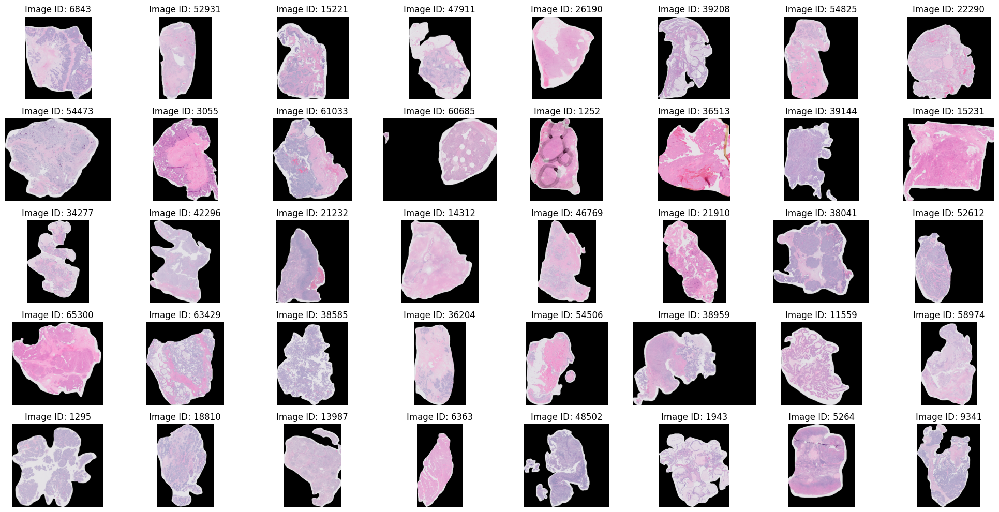

In [125]:
doub_df = train_crop[train_crop['doubled'] == '2'].sample(n=40)
image_paths = doub_df['path'].unique()
image_ids = doub_df['image_id'].unique()
plot40(image_paths,image_ids)

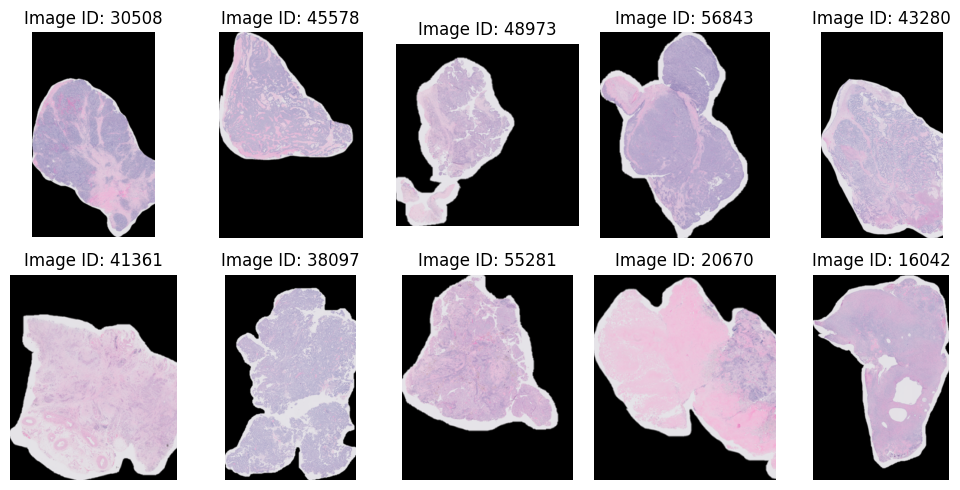

In [126]:
doub_df = train_crop[train_crop['doubled'] == '3'].sample(n=10)
image_paths = doub_df['path'].unique()
image_ids = doub_df['image_id'].unique()
plot10(image_paths,image_ids)

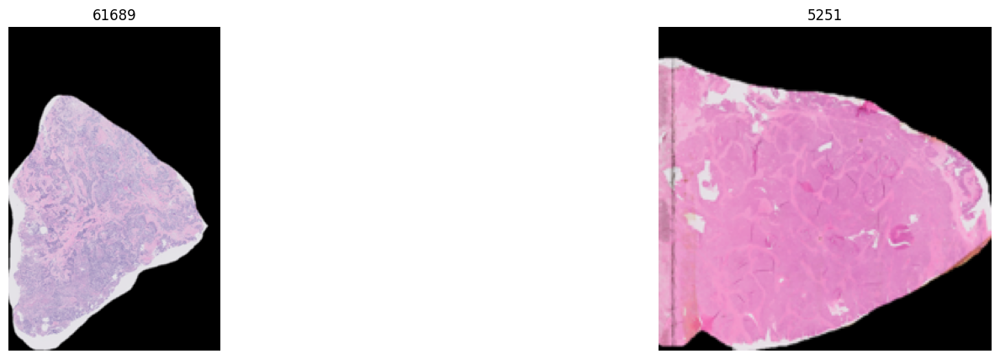

In [127]:
doub_list = train_crop[train_crop['doubled'] == '4']['image_id'].to_list()
image_paths = []
for pic in doub_list:
    path = train_crop[train_crop['image_id'] == pic]['path'].values[0]
    image_paths.append(path)

fig, axes = plt.subplots(1, len(doub_list), figsize=(20, 5))

for i, path in enumerate(image_paths):
    img = mpimg.imread(path)
    axes[i].imshow(img)
    axes[i].set_title(doub_list[i])
    axes[i].axis('off')

plt.show()

In [128]:
# Problematic pictures
image_paths = []
pics=[59031, 16494, 48973,45254]
mask = train_crop['image_id'].isin(pics)
train_crop_filt = train_crop.loc[~mask]
train_crop_filt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 503 entries, 0 to 506
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   index         503 non-null    int64 
 1   image_id      503 non-null    int64 
 2   label         503 non-null    object
 3   image_width   503 non-null    int64 
 4   image_height  503 non-null    int64 
 5   is_tma        503 non-null    bool  
 6   filename      503 non-null    object
 7   path          503 non-null    object
 8   doubled       503 non-null    object
dtypes: bool(1), int64(4), object(4)
memory usage: 35.9+ KB


In [129]:
#pip install histolab

# 4.Zooming the slices

In [182]:
def zoom_white(image, n=50):
    # Convert the image to RGBA mode (if not already in RGBA mode)
    image = image.convert('RGBA')
    # Get the image data as a list of RGBA tuples
    image_data = list(image.getdata())
    # Define the black color threshold (adjust as needed)
    black_threshold = 50
    # Create a new image data list with black background pixels replaced with transparency
    new_image_data = []
    for item in image_data:
    # Check if the pixel is close to black (R, G, B values are all below the threshold)
        if item[0] < black_threshold and item[1] < black_threshold and item[2] < black_threshold:
        # If it's black, set alpha (transparency) to 0
            new_image_data.append((item[0], item[1], item[2], 0))
        else:
        # If it's not black, keep the color and set alpha to 255 (fully opaque)
            new_image_data.append((item[0], item[1], item[2], 255))
        # Create a new image with the modified data
    image.putdata(new_image_data)
    
    center_x = image.width / 2
    center_y = image.height / 2
    # Calculate the half-width and half-height of the crop area
    crop_width = width / 50
    crop_height = height / 50
    # Calculate the left, upper, right, and lower coordinates for cropping
    left = center_x - crop_width
    upper = center_y - crop_height
    right = center_x + crop_width
    lower = center_y + crop_height
    # Crop the zoomed image
    crop_image = image.crop((left, upper, right, lower))
    return crop_image

In [198]:
image = Image.open('/kaggle/working/train_crop/1166_thumbnail.png')
image = zoom_white(image, n=50) 
image

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/train_crop/1166_thumbnail.png'

In [183]:
output_folder = '/kaggle/working/train_crop_zoom_white/'
os.makedirs(output_folder, exist_ok=True)
train_crop_filt.reset_index(drop=True, inplace=True)
for i in range(train_crop_filt.shape[0]):
    input_path = train_crop_filt.loc[i, 'path']
    image = Image.open(input_path)
    image = zoom_white(image, n=50) 
    output_path = os.path.join(output_folder, train_crop_filt.loc[i, 'filename'])
    image.save(output_path)

In [187]:
train_zoom=train_crop_filt.copy()
file_paths = {}
for root, _, files in os.walk('/kaggle/working/train_crop_zoom_white'):
    for filename in files:
        path = os.path.join(root, filename)  
        file_paths[filename]=path
        
train_zoom['path'] = train_zoom['filename'].map(file_paths)
train_zoom.head()

,index,image_id,label,image_width,image_height,is_tma,filename,path,doubled
0,88,9697,HGSC,42323,19928,False,9697_thumbnail.png,/kaggle/working/train_crop_zoom_white/9697_thu...,1
1,90,10143,HGSC,40063,42207,False,10143_thumbnail.png,/kaggle/working/train_crop_zoom_white/10143_th...,1
2,95,10642,HGSC,69213,41391,False,10642_thumbnail.png,/kaggle/working/train_crop_zoom_white/10642_th...,2
3,97,10896,HGSC,48060,37792,False,10896_thumbnail.png,/kaggle/working/train_crop_zoom_white/10896_th...,1
4,99,11417,HGSC,32591,32600,False,11417_thumbnail.png,/kaggle/working/train_crop_zoom_white/11417_th...,1


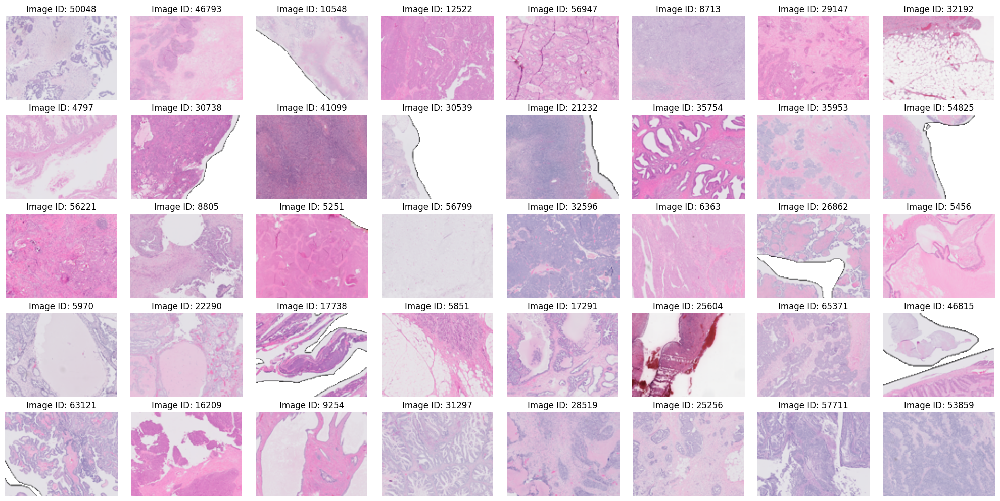

In [197]:
sample = train_zoom.sample(n=40)
image_paths = sample['path'].unique()
image_ids = sample['image_id'].unique()
plot40(image_paths,image_ids)

In [199]:
# Problematic pictures 
pics=[52612,60685,30539,25792,1252, 39144]
mask = train_zoom['image_id'].isin(pics)
train_zoom_filt = train_zoom.loc[~mask]
train_zoom_filt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 497 entries, 0 to 502
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   index         497 non-null    int64 
 1   image_id      497 non-null    int64 
 2   label         497 non-null    object
 3   image_width   497 non-null    int64 
 4   image_height  497 non-null    int64 
 5   is_tma        497 non-null    bool  
 6   filename      497 non-null    object
 7   path          497 non-null    object
 8   doubled       497 non-null    object
dtypes: bool(1), int64(4), object(4)
memory usage: 35.4+ KB


<a id="3"></a>
<h2 style='background:violet; border:0; color:white'><center>3. Convolutional network model</center><h2>

# Image Augmentation:

rotation_range: Randomly rotates the images by up to x degrees. This helps the model generalize better by learning features from various angles.

width_shift_range and height_shift_range: Randomly shifts the images horizontally and vertically by up to x% of the image width or height. This can help the model learn position invariance.

shear_range: Applies shear mapping, which distorts the shape of the object. It randomly distorts the image by shearing it with a shear intensity of up to x%.

zoom_range: Randomly zooms into the images by up to x%. This helps the model learn to focus on specific parts of the image.

horizontal_flip=True: Randomly flips half of the images horizontally. This helps in situations where the orientation of the object in the image doesn't affect its classification.

fill_mode='nearest': This determines the strategy used for filling in newly created pixels. 'nearest' means that the nearest existing pixel will be used to fill the new pixel values.

In [200]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#because data is imbalanced the new pictures are created
datagen = ImageDataGenerator(
    rescale=1./255.,
    validation_split=0.25,
    zoom_range=0.1,
    shear_range=0.1,
    horizontal_flip=True
)

train_generator = datagen.flow_from_dataframe(
    dataframe=train_zoom_filt,
    directory="/kaggle/working/train_crop_white_zoom",
    x_col='path',
    y_col="label",
    subset="training",
    batch_size=40,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size = (100,100))

validation_generator = datagen.flow_from_dataframe(
    dataframe=train_zoom_filt,
    directory="/kaggle/working/train_crop_white_zoom",
    x_col='path',
    y_col="label",
    subset="validation",
    batch_size=20,
    seed=42,
    shuffle=False,
    class_mode="categorical",
    target_size = (100,100))

Found 373 validated image filenames belonging to 5 classes.
Found 124 validated image filenames belonging to 5 classes.


In [140]:
#Visualization of augmented pictures
def plotImages(images_arr):
    fig, axes = plt.subplots(4, 4, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

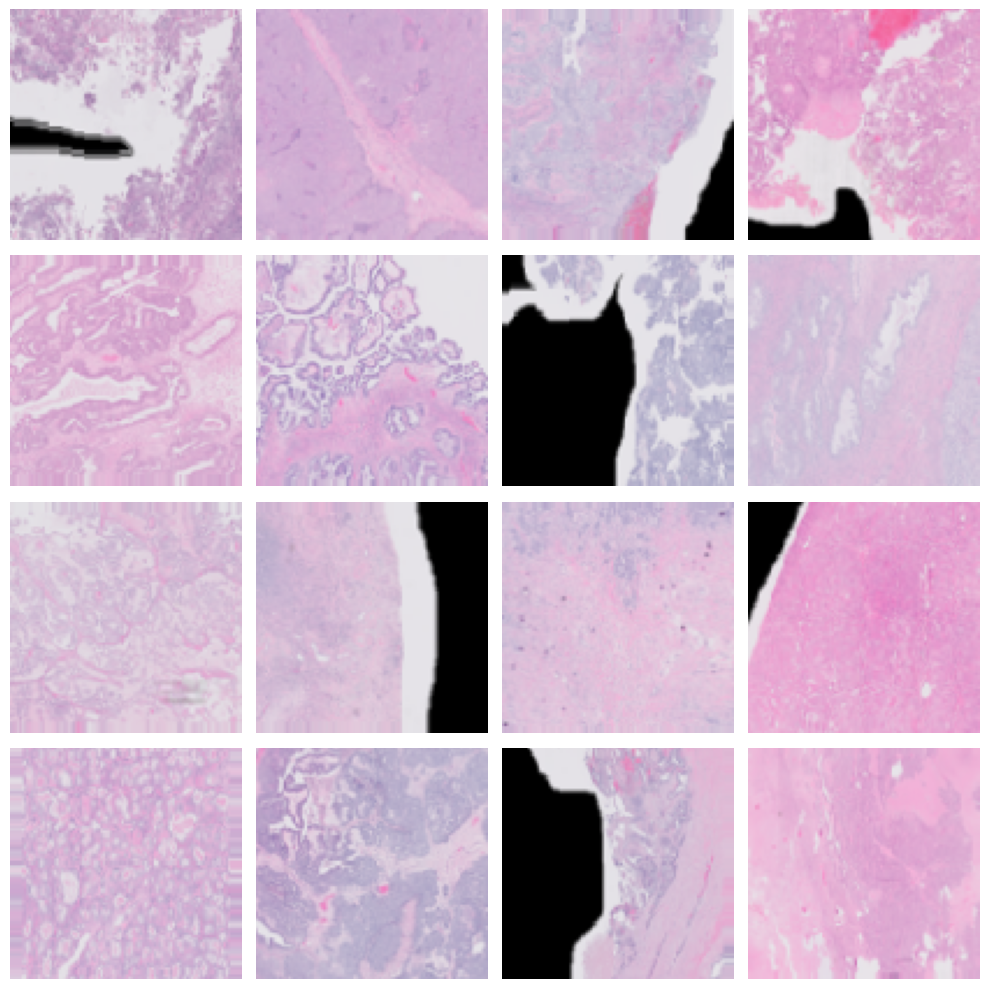

In [201]:
sample_training_images, _ = next(train_generator)
# Plot 16 random images from training data    
plotImages(sample_training_images[:16])

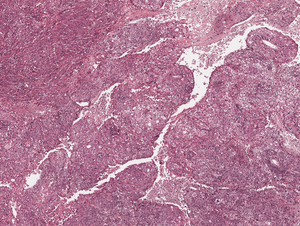

In [142]:
path = '/kaggle/input/UBC-OCEAN/test_thumbnails/41_thumbnail.png'
image = Image.open(path)
image = crop(image,20)
output_dir = '/kaggle/working/test'
os.makedirs(output_dir, exist_ok=True)

output_path = '/kaggle/working/test/41_thumbnail_cropped.png'
image.save(output_path)
image

In [143]:
# Test your model on unknown samples (testing data)
# If the test_df contains doubled images, its needed to be cut
# The image was zoomed

test_df = pd.read_csv('/kaggle/input/UBC-OCEAN/test.csv')
test_df['filename'] = test_df['image_id'].astype(str)+'_thumbnail.png'
#file_paths = {}
#for root, _, files in os.walk('/kaggle/working/test/test_thumbnails/'):
    #for filename in files:
        #path = os.path.join(root, filename)  
        #file_paths[filename]=path
        
test_df['path'] = '/kaggle/working/test/41_thumbnail_cropped.png'

correct_type = pd.read_csv('/kaggle/input/UBC-OCEAN/sample_submission.csv')
display('The correct type of ovarian cancer on test image',
        correct_type)

test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,               
    directory="/kaggle/input/UBC-OCEAN/test_thumbnails",  
    batch_size=32,                      
    seed=42,                            
    shuffle=False,                      # Set shuffle to False for test data
    target_size=(100, 100),             
    class_mode=None,                    # Set class_mode to None because there are no labels for test data
    x_col='path'                        
)

'The correct type of ovarian cancer on test image'

,image_id,label
0,41,HGSC


Found 1 validated image filenames.


In [144]:
#Plot for accuracy and val_loss
def plot_accur(history, epochs=20):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(epochs)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')
    
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

# The basic model

In [202]:
model = Sequential([    
    Conv2D(32, (3, 3), activation='relu', input_shape = (100,100,3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(5, activation='softmax')  # num_classes is the number of output classes
])
K.clear_session()
model.compile(optimizer='adam',  #Adam(lr=x)
              loss='categorical_crossentropy',  
              metrics=['accuracy'])
history=model.fit(train_generator,
          epochs=10,
          validation_data=validation_generator)
history

Epoch 1/10
10/10 [==============================] - 4s 209ms/step - loss: 1.7882 - accuracy: 0.2547 - val_loss: 1.2273 - val_accuracy: 0.7339
Epoch 2/10
10/10 [==============================] - 2s 170ms/step - loss: 1.5530 - accuracy: 0.3003 - val_loss: 1.4037 - val_accuracy: 0.2097
Epoch 3/10
10/10 [==============================] - 2s 180ms/step - loss: 1.5351 - accuracy: 0.3083 - val_loss: 1.2154 - val_accuracy: 0.7258
Epoch 4/10
10/10 [==============================] - 2s 161ms/step - loss: 1.5143 - accuracy: 0.3244 - val_loss: 1.2127 - val_accuracy: 0.7258
Epoch 5/10
10/10 [==============================] - 2s 165ms/step - loss: 1.5203 - accuracy: 0.3298 - val_loss: 1.2218 - val_accuracy: 0.6935
Epoch 6/10
10/10 [==============================] - 2s 166ms/step - loss: 1.4911 - accuracy: 0.3324 - val_loss: 1.3265 - val_accuracy: 0.7177
Epoch 7/10
10/10 [==============================] - 2s 164ms/step - loss: 1.4733 - accuracy: 0.3458 - val_loss: 1.2524 - val_accuracy: 0.6855
Epoch 

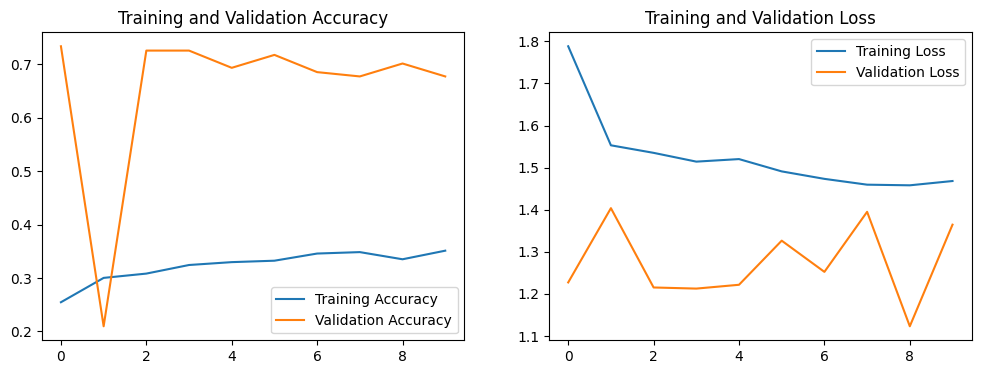

In [203]:
# Accuracy and loss for train and validation datasets
plot_accur(history, epochs=10)

In [204]:
predictions = model.predict(test_generator)
predicted_classes = []
classes = train_crop.label.unique()

for prediction in predictions:
    predicted_class_index = np.argmax(prediction)
    predicted_class = classes[predicted_class_index]  
    predicted_classes.append(predicted_class)  
submission = test_df.copy()
submission.loc[:, 'label'] = predicted_classes
cols=['image_id', 'label']
submission = submission[cols]
submission

1/1 [==============================] - 0s 93ms/step


,image_id,label
0,41,EC


# Expanded network

In [218]:
input_shape = (100,100,3)
model = Sequential([
    # Add convolutional/pooling layers+batch normalization
    Conv2D(filters=32, kernel_size=(3,3),input_shape=input_shape, activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=64, kernel_size=(3,3),input_shape=input_shape, activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(filters=128, kernel_size=(3,3),input_shape=input_shape, activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    
    Flatten(),
    
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(5,activation='softmax')
])

# Print summary of your model
model.summary() 

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 32)        896       
                                                                 
 batch_normalization (BatchN  (None, 98, 98, 32)       128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 49, 49, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 47, 47, 64)        18496     
                                                                 
 batch_normalization_1 (Batc  (None, 47, 47, 64)       256       
 hNormalization)                                                 
                                                        

In [219]:
K.clear_session()
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  
              metrics=['accuracy'])
history=model.fit(train_generator,
          epochs=10,
          validation_data=validation_generator)
history

Epoch 1/10
10/10 [==============================] - 5s 191ms/step - loss: 2.3971 - accuracy: 0.2627 - val_loss: 1.5838 - val_accuracy: 0.1935
Epoch 2/10
10/10 [==============================] - 2s 171ms/step - loss: 1.5253 - accuracy: 0.2976 - val_loss: 1.5434 - val_accuracy: 0.7258
Epoch 3/10
10/10 [==============================] - 2s 169ms/step - loss: 1.4197 - accuracy: 0.3995 - val_loss: 1.5114 - val_accuracy: 0.1532
Epoch 4/10
10/10 [==============================] - 2s 166ms/step - loss: 1.3871 - accuracy: 0.4182 - val_loss: 1.4517 - val_accuracy: 0.1210
Epoch 5/10
10/10 [==============================] - 2s 173ms/step - loss: 1.2929 - accuracy: 0.4638 - val_loss: 1.2978 - val_accuracy: 0.6048
Epoch 6/10
10/10 [==============================] - 2s 165ms/step - loss: 1.3291 - accuracy: 0.4102 - val_loss: 1.3984 - val_accuracy: 0.1210
Epoch 7/10
10/10 [==============================] - 2s 168ms/step - loss: 1.3194 - accuracy: 0.4477 - val_loss: 1.3231 - val_accuracy: 0.1210
Epoch 

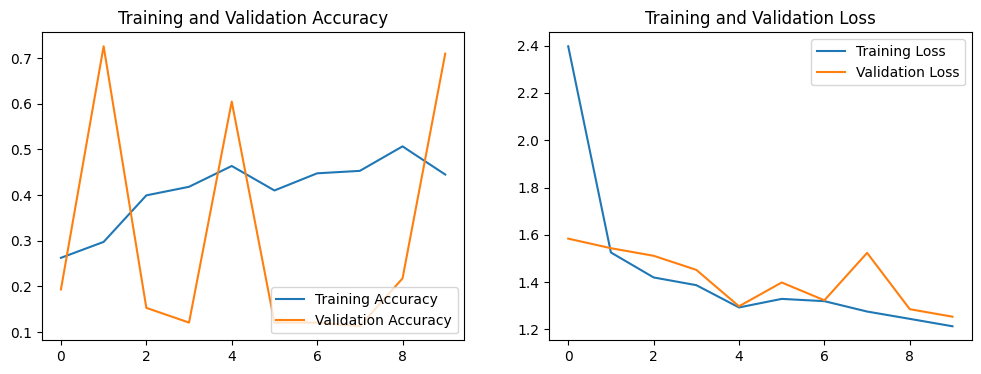

In [220]:
plot_accur(history, epochs=10)

In [221]:
predictions = model.predict(test_generator)
predicted_classes = []
classes = train_crop.label.unique()

for prediction in predictions:
    predicted_class_index = np.argmax(prediction)
    predicted_class = classes[predicted_class_index]  
    predicted_classes.append(predicted_class)  
submission = test_df.copy()
submission.loc[:, 'label'] = predicted_classes
cols=['image_id', 'label']
submission = submission[cols]
submission

1/1 [==============================] - 0s 172ms/step


,image_id,label
0,41,CC


# SPECIAL NETWORK MODELS

- **ResNet:** Leveraging its depth and performance to identify subtle patterns in cancer cell images.

- **Inception:** Efficiently utilizing computational resources to detect unique features indicative of different cancer types.

- **MobileNet:** Balancing speed and accuracy, making it ideal for analyzing large volumes of cell tissue samples.

- **EfficientNet:** Offering state-of-the-art performance, which could be beneficial in achieving high classification accuracy for ovarian cancer types.

- **VGGNet:** Providing a simple yet effective approach, making it a good starting point for educational purposes or as a baseline model.

## ResNet

In [209]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

# Load pre-trained ResNet50 model without the top (classification) layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(100, 100, 3))

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Add your own classification layers on top of the base model
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)  # Global average pooling layer
x = layers.Dense(256, activation='relu')(x)  # Dense layer with 256 units and ReLU activation
predictions = layers.Dense(5, activation='softmax')(x)  # Output layer with softmax activation for num_classes classes

# Create the final model
model = models.Model(inputs=base_model.input, outputs=predictions)
K.clear_session()
# Compile the model
model.compile(optimizer=Adam(lr=0.0001),  # You can adjust the learning rate
              loss='categorical_crossentropy',  # Use categorical_crossentropy for multi-class classification
              metrics=['accuracy'])
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
)
history

Epoch 1/10
10/10 [==============================] - 7s 358ms/step - loss: 1.7715 - accuracy: 0.2306 - val_loss: 1.2941 - val_accuracy: 0.7339
Epoch 2/10
10/10 [==============================] - 2s 194ms/step - loss: 1.5914 - accuracy: 0.2761 - val_loss: 1.2947 - val_accuracy: 0.7339
Epoch 3/10
10/10 [==============================] - 2s 180ms/step - loss: 1.5550 - accuracy: 0.3083 - val_loss: 1.1711 - val_accuracy: 0.7339
Epoch 4/10
10/10 [==============================] - 2s 176ms/step - loss: 1.5552 - accuracy: 0.2815 - val_loss: 1.3380 - val_accuracy: 0.1210
Epoch 5/10
10/10 [==============================] - 2s 175ms/step - loss: 1.5540 - accuracy: 0.2547 - val_loss: 1.1488 - val_accuracy: 0.7339
Epoch 6/10
10/10 [==============================] - 2s 195ms/step - loss: 1.5582 - accuracy: 0.3217 - val_loss: 1.4301 - val_accuracy: 0.1694
Epoch 7/10
10/10 [==============================] - 2s 178ms/step - loss: 1.5531 - accuracy: 0.3110 - val_loss: 1.0668 - val_accuracy: 0.7258
Epoch 

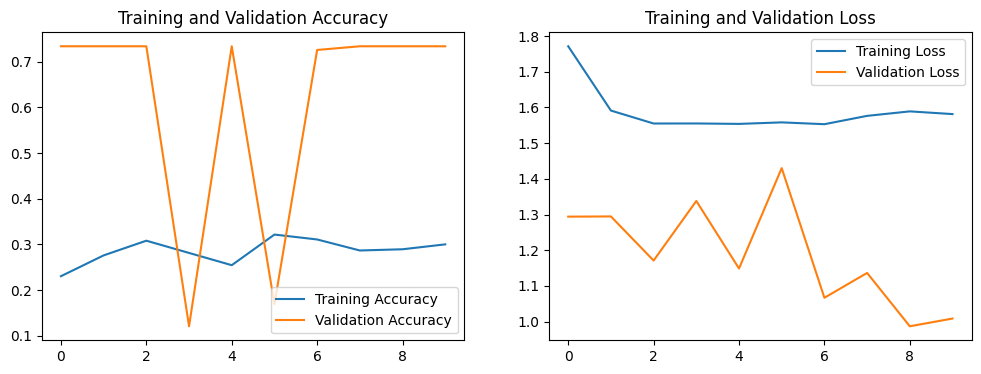

In [210]:
plot_accur(history, epochs=10)

In [211]:
predictions = model.predict(test_generator)
predicted_classes = []
classes = train_crop.label.unique()

for prediction in predictions:
    predicted_class_index = np.argmax(prediction)
    predicted_class = classes[predicted_class_index]  
    predicted_classes.append(predicted_class)  
submission = test_df.copy()
submission.loc[:, 'label'] = predicted_classes
cols=['image_id', 'label']
submission = submission[cols]
submission

1/1 [==============================] - 1s 1s/step


,image_id,label
0,41,CC


## EfficientNet

In [215]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model

# Load pre-trained EfficientNetB0 model without the top (classification) layer
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(100, 100, 3))
num_classes = 5
# Add your own classification layers on top of the base model
x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)  
x = Dense(256, activation='relu')(x)  
predictions = Dense(num_classes, activation='softmax')(x)  

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)
K.clear_session()
# Compile the model
model.compile(optimizer=Adam(lr=0.0001),  
              loss='categorical_crossentropy',  
              metrics=['accuracy'])
history = model.fit(
    train_generator,
    epochs=20,
    validation_data=validation_generator,
)
history

Epoch 1/20


2023-11-15 11:07:14.225677: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 43s 351ms/step - loss: 1.6319 - accuracy: 0.3056 - val_loss: 2.3804 - val_accuracy: 0.0000e+00
Epoch 2/20
10/10 [==============================] - 2s 179ms/step - loss: 1.2581 - accuracy: 0.4799 - val_loss: 2.1606 - val_accuracy: 0.0968
Epoch 3/20
10/10 [==============================] - 2s 177ms/step - loss: 1.0601 - accuracy: 0.5871 - val_loss: 2.3222 - val_accuracy: 0.0806
Epoch 4/20
10/10 [==============================] - 2s 180ms/step - loss: 0.8582 - accuracy: 0.6595 - val_loss: 2.0313 - val_accuracy: 0.0000e+00
Epoch 5/20
10/10 [==============================] - 2s 186ms/step - loss: 0.7163 - accuracy: 0.7239 - val_loss: 1.8102 - val_accuracy: 0.0000e+00
Epoch 6/20
10/10 [==============================] - 2s 180ms/step - loss: 0.4888 - accuracy: 0.8231 - val_loss: 1.4743 - val_accuracy: 0.0000e+00
Epoch 7/20
10/10 [==============================] - 2s 179ms/step - loss: 0.4944 - accuracy: 0.8338 - val_loss: 1.0620 - val_accuracy: 0.7339


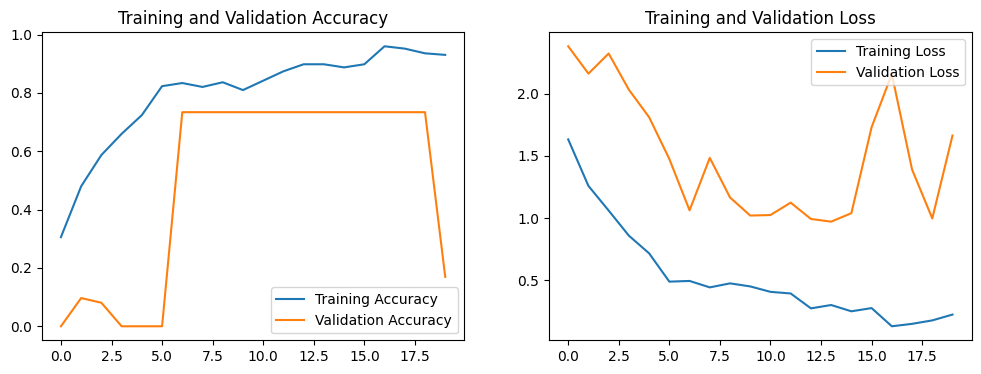

In [216]:
plot_accur(history, epochs=20)

In [217]:
predictions = model.predict(test_generator)
predicted_classes = []
classes = train_crop.label.unique()

for prediction in predictions:
    predicted_class_index = np.argmax(prediction)
    predicted_class = classes[predicted_class_index]  
    predicted_classes.append(predicted_class)  
submission = test_df.copy()
submission.loc[:, 'label'] = predicted_classes
cols=['image_id', 'label']
submission = submission[cols]
submission

1/1 [==============================] - 1s 1s/step


,image_id,label
0,41,EC


## Inception

Multi-scale Processing:

Inception modules use filters of different sizes (1x1, 3x3, 5x5) simultaneously. This allows the network to capture patterns at different scales in the input data.
Parameter Efficiency:

1x1 convolutions are used to reduce the number of input channels before applying larger convolutions. This helps in reducing the number of parameters and computational cost.
Computational Efficiency:

By using parallel convolutions and concatenating their outputs, the network can process information in a computationally efficient manner.
Network Depth:

The architecture allows for effective training of very deep networks. This was crucial as deeper networks were found to perform better on certain tasks.
Global Average Pooling:

The architecture uses global average pooling instead of fully connected layers in the final layers. This reduces the risk of overfitting and decreases the number of parameters.
Feature Reuse:

The network encourages feature reuse by using 1x1 convolutions. This enables the network to learn a variety of low and high-level features.
High Accuracy:

Inception architectures have achieved state-of-the-art performance on various image classification tasks, demonstrating their effectiveness.
Versatility:

The Inception architecture has been used as a base architecture for other tasks beyond image classification, such as object detection (in the context of the Inception V2 and V3 models).

In [156]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, AveragePooling2D, concatenate, Flatten, Dense
from tensorflow.keras.models import Model

def inception_module(x, filters):
    conv1x1 = Conv2D(filters[0], (1, 1), padding='same', activation='relu')(x)
    
    conv3x3_reduce = Conv2D(filters[1], (1, 1), padding='same', activation='relu')(x)
    conv3x3 = Conv2D(filters[2], (3, 3), padding='same', activation='relu')(conv3x3_reduce)
    
    conv5x5_reduce = Conv2D(filters[3], (1, 1), padding='same', activation='relu')(x)
    conv5x5 = Conv2D(filters[4], (5, 5), padding='same', activation='relu')(conv5x5_reduce)
    
    maxpool = MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    maxpool_proj = Conv2D(filters[5], (1, 1), padding='same', activation='relu')(maxpool)
    
    inception = concatenate([conv1x1, conv3x3, conv5x5, maxpool_proj], axis=-1)
    
    return inception

input_shape = (100, 100, 3)
input_layer = Input(shape=input_shape)

# Build Inception layers
inception1 = inception_module(input_layer, [64, 128, 128, 32, 32, 32])
inception2 = inception_module(inception1, [128, 192, 192, 64, 64, 64])

# Add more inception modules as needed

# Flatten and add dense layers for classification
flatten = Flatten()(inception2)
dense1 = Dense(256, activation='relu')(flatten)
output_layer = Dense(5, activation='softmax')(dense1)  # Adjust num_classes based on your task

# Create the model
inception_model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
inception_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

history = inception_model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
)
history

ResourceExhaustedError: {{function_node __wrapped__AddV2_device_/job:localhost/replica:0/task:0/device:GPU:0}} failed to allocate memory [Op:AddV2]